# Importation des librairies

In [1]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier

pd.set_option('display.max_columns', None)

In [2]:
# Résolution des figures
plt.rcParams['figure.dpi'] = 200

# Seaborn style d'affichage
sns.set(rc={'axes.facecolor': '#faded9'}, style='darkgrid')

# Lecture du Dataset

In [3]:
# Lire le fichier CSV
df = pd.read_csv('visites_6.csv', sep=';', low_memory=False)

# Définir la liste des colonnes à garder
colonnes = ['cle','a_bilan','date_bilan','sexe2','age3','pcs1','ct_plein','ct_j_normal','ct_j_coupure','ct_j_decale','ct_j_alterne','ct_j_nuit','ct_j_deplace',
            'ct_c_depasse','ct_c_repas','ct_c_rigueur','ct_c_pression','ct_a_apprend','ct_a_varie','ct_a_libre','ct_a_coop','ct_a_reconnu','ct_ex_psy',
            'm_sport','m_trajet','m_tabac2','s_anxiete_plainte','s_fatigue_plainte','s_sommeil_plainte','ct_a_desapprouve','ct_a_emploi','ct_a_concilier',
            'ct_a_qualite','qc_ieg_perspective','qc_ieg_sens','qc_ieg_objectif','qc_ieg_suggestion','qc_ieg_ambiance','ct_c_aba_neg2','ct_cp_posture2',
            'ct_cp_effort2','ct_cp_repet2','ct_cp_pieton2','ct_cp_debout2','f_1an2']

# Filtrer le DataFrame
df = pd.DataFrame(df, columns=colonnes)

# Renommer les colonnes
df = df.rename(columns={
    'sexe2': 'sexe',
    'age3': 'age',
    'pcs1': 'pcs',
    'ct_plein': 'tps_plein',
    'ct_j_normal': 'jour_norm',
    'ct_j_coupure': 'jour_coup',
    'ct_j_decale': 'jour_decale',
    'ct_j_alterne': 'jour_alterne',
    'ct_j_nuit': 'travail_nuit',
    'ct_j_deplace': 'deplac_pro',
    'ct_c_depasse': 'depasse_horaire',
    'ct_c_repas': 'saut_repas',
    'ct_c_rigueur': 'trop_vite',
    'ct_c_pression': 'pression',
    'ct_a_apprend': 'apprend',
    'ct_a_varie': 'varie',
    'ct_a_libre': 'libre',
    'ct_a_coop': 'cooperation',
    'ct_a_reconnu': 'reconnu',
    'ct_ex_psy': 'psy',
    'ct_a_desapprouve': 'desapprouve',
    'ct_a_emploi': 'peur_emploi',
    'ct_a_concilier': 'concilier_vie',
    'ct_a_qualite': 'qualite_travail',
    'ct_c_aba_neg2': 'taches_diff',
    'f_1an2': 'pas_formation',
    'qc_ieg_perspective': 'perspective',
    'qc_ieg_sens': 'sens',
    'qc_ieg_objectif': 'objectif',
    'qc_ieg_suggestion': 'suggestion',
    'qc_ieg_ambiance': 'ambiance',
    'm_sport' : 'sport',
    'm_tabac2' : 'tabac',
    'm_trajet' : 'trajet',
    'ct_cp_posture2' : 'posture',
    'ct_cp_effort2' : 'effort',
    'ct_cp_repet2' : 'repetitif',
    'ct_cp_pieton2' : 'pieton',
    'ct_cp_debout2' : 'debout'
})

# Afficher les dimensions du DataFrame.
print(" Dimension de df avant sélection : ", df.shape)

 Dimension de df avant sélection :  (119567, 45)


In [4]:
# Garde la visite la plus récente pour chaque personne
df = df.sort_values('date_bilan').drop_duplicates(subset='cle', keep='last')

# On supprime les lignes erreurs (pcs en 1 et 2)
df = df[~df['pcs'].isin([1, 2])]

# On garde les années de 2010 à 2025 (1 personnes en 2008, 45 en 2009, 331 en 2010, 1445 en 2011,.., 10 537 en 2024, 989 en 2025)
df=df[(df['a_bilan']>2009)]

# Supprime les colonnes cle et bilan.
df = df.drop(['cle','date_bilan', 'a_bilan'], axis=1)

# Affiche la taille du DataFrame.
print(" Dimension de df après sélection : ", df.shape)

 Dimension de df après sélection :  (61226, 42)


In [5]:
#'pnp' est 1 si 's_anxiete_plainte', 's_fatigue_plainte' ou 's_sommeil_plainte' est égal à 1, sinon 0.
df['pnp'] = ((df['s_anxiete_plainte'] == 1) | (df['s_fatigue_plainte'] == 1) | (df['s_sommeil_plainte'] == 1)).astype(int)

# On retire les colonnes qui ont permis à la définition de la variable pnp
df.drop(['s_anxiete_plainte', 's_fatigue_plainte', 's_sommeil_plainte'],axis='columns', inplace=True)

## Gérer les valeurs manquantes

In [6]:
# Compter le nombre total initial de valeurs manquantes
initial_nan_count = df.isnull().sum().sum()

# Vérifier s'il y a des valeurs manquantes
if initial_nan_count > 0:    
    # Afficher le nombre initial de valeurs manquantes
    print(f"Nombre initial de valeurs manquantes dans les caractéristiques : {initial_nan_count}")
    
    # Créer une copie du DataFrame pour travailler dessus
    df_processed = df.copy()
    
    # Supprimer les lignes contenant au moins une valeur manquante
    df_processed.dropna(inplace=True)
    
    # Compter les valeurs manquantes restantes (devrait être 0)
    final_nan_count = df_processed.isnull().sum().sum()
    print(f"Nombre de valeurs manquantes après suppression des lignes : {final_nan_count}")
    
    # Afficher le nombre de lignes qui ont été supprimées
    print(f"Nombre de lignes supprimées : {len(df) - len(df_processed)}")
    
    # Mettre à jour le DataFrame principal avec la version nettoyée
    df = df_processed
    df = df.reset_index(drop=True)
    print("Les lignes avec des valeurs manquantes ont été supprimées.")
else:
    print("Aucune valeur manquante trouvée dans les caractéristiques. L'imputation est ignorée.")

Nombre initial de valeurs manquantes dans les caractéristiques : 37748
Nombre de valeurs manquantes après suppression des lignes : 0
Nombre de lignes supprimées : 13534
Les lignes avec des valeurs manquantes ont été supprimées.


In [7]:
print("Taille de df après nettoyage : ",df.shape)

Taille de df après nettoyage :  (47692, 40)


In [8]:
print("\nDécompte des valeurs dans la colonne 'pnp':")

# Affiche le nombre d'occurrences pour chaque valeur
print(df['pnp'].value_counts())

# Affiche le pourcentage de chaque valeur
print("\nPourcentage des valeurs dans la colonne 'pnp':")
print((df['pnp'].value_counts(normalize=True) * 100).round(1))


Décompte des valeurs dans la colonne 'pnp':
pnp
0    32766
1    14926
Name: count, dtype: int64

Pourcentage des valeurs dans la colonne 'pnp':
pnp
0    68.7
1    31.3
Name: proportion, dtype: float64


In [9]:
df.head()

,sexe,age,pcs,tps_plein,jour_norm,jour_coup,jour_decale,jour_alterne,travail_nuit,deplac_pro,depasse_horaire,saut_repas,trop_vite,pression,apprend,varie,libre,cooperation,reconnu,psy,sport,trajet,tabac,desapprouve,peur_emploi,concilier_vie,qualite_travail,perspective,sens,objectif,suggestion,ambiance,taches_diff,posture,effort,repetitif,pieton,debout,pas_formation,pnp
0,2,2.0,3,1.0,0.0,0.0,0.0,1.0,0.0,0.0,3.0,3.0,3.0,7.0,2.0,2.0,2.0,1.0,2.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,4.0,1.0,0.0,0.0,2.0,0.0,0.0,1.0,1
1,1,3.0,3,1.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,2.0,8.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,2.0,3.0,1.0,1.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,2.0,2.0,0.0,1.0,1
2,1,0.0,6,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,5.0,2.0,2.0,2.0,2.0,2.0,0.0,1.0,0.0,0.0,3.0,1.0,3.0,3.0,2.0,2.0,2.0,2.0,7.0,1.0,0.0,0.0,2.0,2.0,0.0,1.0,0
3,1,1.0,4,1.0,1.0,0.0,0.0,1.0,0.0,0.0,2.0,2.0,1.0,8.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,0.0,2.0,1.0,2.0,3.0,2.0,3.0,7.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0
4,1,3.0,4,1.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,1.0,3.0,3.0,3.0,3.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,3.0,3.0,3.0,3.0,3.0,9.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,0


## Description du jeu de données

| Variable        | Description                                                                                                                                                                                                                                                                                                            |
| :-------------- | :--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| sexe            | Sexe (numerique) (1: Homme / 2: Femme)                                                                                                                                                                                                                                                                                 |
| age             | Age (en 4 classes) (0 : < 30 ans / 1 : entre 30 et 40 ans / 2 : entre 40 et 50 ans / 3 : > 50 ans)                                                                                                                                                                                                                       |
| pcs             | Code PCS-ESE 2003 - niveau 1 : (3 : Cadres et professions intellectuelles supérieures / 4 : Profession intermédiaires / 5 : Employés / 6 : Ouvriers)                                                                                                                                                                    |
| tps_plein       | Travaillez-vous à temps plein ? (1 : Oui / 0 : Non)                                                                                                                                                                                                                                                                    |
| jour_norm       | Habituellement travaillez-vous en journée normale ? (1 : Oui / 0 : Non)                                                                                                                                                                                                                                               |
| jour_coup       | Des coupures de plus de 2 heures (1 : Oui / 0 : Non)                                                                                                                                                                                                                                                                   |
| jour_decale     | Des horaires décalés (tôt le matin, tard le soir) (1 : Oui / 0 : Non)                                                                                                                                                                                                                                                 |
| jour_alterne    | Des horaires irréguliers ou alternés (1 : Oui / 0 : Non)                                                                                                                                                                                                                                                              |
| travail_nuit    | Du travail de nuit (entre 0h et 5h) (1 : Oui / 0 : Non)                                                                                                                                                                                                                                                                |
| deplac_pro      | Faites-vous régulièrement des déplacements professionnels de plus de 24 heures ? (1 : Oui / 0 : Non)                                                                                                                                                                                                                   |
| depasse_horaire | Dépasser vos horaires normaux (0 : Jamais / 1 : Rarement / 2 : Assez souvent / 3 : Souvent)                                                                                                                                                                                                                            |
| saut_repas      | Sauter ou écourter un repas, ne pas prendre de pause (0 : Jamais / 1 : Rarement / 2 : Assez souvent / 3 : Souvent)                                                                                                                                                                                                     |
| trop_vite       | Traiter trop vite une opération qui demanderait davantage de soin (0 : Jamais / 1 : Rarement / 2 : Assez souvent / 3 : Souvent)                                                                                                                                                                                      |
| pression        | Pouvez-vous coter les difficultés liées à la pression temporelle (devoir se dépêcher, faire tout très vite, …) (0/1/2/3/4/5/6/7/8/9/10)                                                                                                                                                                            |
| apprend         | Votre travail vous permet d'apprendre des choses (0 : Non pas du tout / 1 : Plutôt non / 2 : Plutôt oui / 3 : Oui tout à fait)                                                                                                                                                                                      |
| varie           | Votre travail est varié (0 : Non pas du tout / 1 : Plutôt non / 2 : Plutôt oui / 3 : Oui tout à fait)                                                                                                                                                                                                                |
| libre           | Vous pouvez choisir vous-même la façon de procéder (0 : Non pas du tout / 1 : Plutôt non / 2 : Plutôt oui / 3 : Oui tout à fait)                                                                                                                                                                                     |
| cooperation     | Vous avez des possibilités suffisantes d'entraide, de coopération (0 : Non pas du tout / 1 : Plutôt non / 2 : Plutôt oui / 3 : Oui tout à fait)                                                                                                                                                                    |
| reconnu         | Votre travail est reconnu par votre entourage professionnel (0 : Non pas du tout / 1 : Plutôt non / 2 : Plutôt oui / 3 : Oui tout à fait)                                                                                                                                                                         |
| psy             | Pression psychologique (1 : Oui / 0 : Non)                                                                                                                                                                                                                                                                         |
| sport   | Faites vous de façon régulière (au moins 1 fois/semaine) une activité physique ou sportive (1 : Oui / 0 : Non)                                                                                                                                                                                                                                                                |
| trajet   | Avez-vous des trajets domicile/travail longs ou pénibles (1 : Oui / 0 : Non)                                                                                                                                                                                                                                                                |
| tabac   | Consommation de tabac (1 : Oui / 0 : Non)                                                                                                                                                                                                                                                                |
| s_anxiete_plainte | Anxiété, nervosité, irritabilité, existence de plaintes ou de signes cliniques (1 : Oui / 0 : Non)                                                                                                                                                                                                             |
| s_fatigue_plainte | Fatigue,lassitude, existence de plaintes ou de signes cliniques (1 : Oui / 0 : Non)                                                                                                                                                                                                                               |
| s_sommeil_plainte | Troubles du sommeil, existence de plaintes ou de signes cliniques (1 : Oui / 0 : Non)                                                                                                                                                                                                                             |
| desapprouve     | Vous devez faire des choses que vous désapprouvez (0 : Non pas du tout / 1 : Plutôt non / 2 : Plutôt oui / 3 : Oui tout à fait)                                                                                                                                                                                    |
| peur_emploi     | Vous travaillez avec la peur de perdre votre emploi (0 : Non pas du tout / 1 : Plutôt non / 2 : Plutôt oui / 3 : Oui tout à fait)                                                                                                                                                                                  |
| concilier_vie   | Vous arrivez à concilier vie professionnelle et vie hors-travail (0 : Non pas du tout / 1 : Plutôt non / 2 : Plutôt oui / 3 : Oui tout à fait)                                                                                                                                                                    |
| qualite_travail | Vous avez les moyens de faire un travail de bonne qualité (0 : Non pas du tout / 1 : Plutôt non / 2 : Plutôt oui / 3 : Oui tout à fait)                                                                                                                                                                          |
| perspective     | Avez-vous le sentiment d'avoir des perspectives dans votre métier ou dans votre entreprise ? (0 : Non pas du tout / 1 : Plutôt non / 2 : Plutôt oui / 3 : Oui tout à fait)                                                                                                                                         |
| sens            | Trouvez-vous du sens et de l'intérêt dans le travail que vous effectuez ? (0 : Non pas du tout / 1 : Plutôt non / 2 : Plutôt oui / 3 : Oui tout à fait)                                                                                                                                                            |
| objectif        | Pour effectuer votre travail, avez-vous des objectifs et des consignes clairement définis ? (0 : Non pas du tout / 1 : Plutôt non / 2 : Plutôt oui / 3 : Oui tout à fait)                                                                                                                                          |
| suggestion      | Pouvez-vous agir sur votre organisation de travail en exprimant votre point de vue et en faisant des suggestions ? (0 : Non pas du tout / 1 : Plutôt non / 2 : Plutôt oui / 3 : Oui tout à fait)                                                                                                                    |
| ambiance        | Pouvez-vous coter votre ambiance de travail : (0=Très mauvaise - 10=Très bonne)                                                                                                                                                                                                                                      |
| taches_diff     | Abandons de tâches perturbantes (1 : Oui / 0 : Non)                                                                                                                                                                                                                                                                 |
| posture   | Postures contraignantes & pénibilité (1 : Oui / 0 : Non)                                                                                                                                                                                                                                                            |
| effort    | Effort, port de charges lourdes & pénibilité (1 : Oui / 0 : Non)                                                                                                                                                                                                                                                    |
| repetitif     | Gestes répétitifs & pénibilité (1 : Oui / 0 : Non)                                                                                                                                                                                                                                                                  |
| pieton    | Importants déplacements à pied & pénibilité (1 : Oui / 0 : Non)                                                                                                                                                                                                                                                     |
| debout    | Station debout prolongée & pénibilité (1 : Oui / 0 : Non)                                                                                                                                                                                                                                                           |
| pas_formation   | Absence de formation depuis 1 an (1 : Oui / 0 : Non)                                                                                                                                                                                                                                                                |
| pnp   | Plainte NeuroPsychique (PNP) : présence d'au moins l'une des trois plaintes neuropsychiques (anxiété, fatigue ou troubles du sommeil) (1 : Oui / 0 : Non)                                                                                                                                                         |


On inverse certaines varibales pour que le score le plus haut indique un problème

In [10]:
# pour l'échelle 0-1
variables_binaires_a_inverser = ['tps_plein', 'jour_norm','sport']
for col in variables_binaires_a_inverser:
    df[col] = 1 - df[col] # Inversion: 0->1, 1->0

# pour l'échelle 0-3
variables_ordinales_0_3_a_inverser = [
    'apprend', 'varie', 'libre', 'cooperation', 'reconnu',
    'concilier_vie', 'qualite_travail', 'perspective', 'sens',
    'objectif', 'suggestion'
]
for col in variables_ordinales_0_3_a_inverser:
    df[col] = 3 - df[col] # Inversion: 0->3, 1->2, 2->1, 3->0

# pour l'échelle 0-10
df['ambiance'] = 10 - df['ambiance'] # Inversion: 0->10, ..., 10->0

# Vue d'ensemble du jeu de données

## Informations basiques du jeu de données

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47692 entries, 0 to 47691
Data columns (total 40 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sexe             47692 non-null  int64  
 1   age              47692 non-null  float64
 2   pcs              47692 non-null  int64  
 3   tps_plein        47692 non-null  float64
 4   jour_norm        47692 non-null  float64
 5   jour_coup        47692 non-null  float64
 6   jour_decale      47692 non-null  float64
 7   jour_alterne     47692 non-null  float64
 8   travail_nuit     47692 non-null  float64
 9   deplac_pro       47692 non-null  float64
 10  depasse_horaire  47692 non-null  float64
 11  saut_repas       47692 non-null  float64
 12  trop_vite        47692 non-null  float64
 13  pression         47692 non-null  float64
 14  apprend          47692 non-null  float64
 15  varie            47692 non-null  float64
 16  libre            47692 non-null  float64
 17  cooperation 

- **Nombre d'entrées** Le dataset consiste en **47 692 entrées** de 0 à 47 692
- **Colonnes** : Il y a 40 colonnes correspondants aux diverses attributs des salariés
- **Type de donnée**:
    - La plupart des colonnes sont en float64
    - Seulement le sexe, pcs et pnp sont en int64
- **Valeurs manquantes** : Les valeurs manquantes ont été traités par suppression, on passe de 61 226 entrées à 47 692

**Note** :  Basé sur la sémantique de nos données, celles-ci sont plutôt de nature catégorielle et devraient être converties au format object

In [12]:
# Convertir en objet
df = df.astype('object')

df.dtypes

sexe               object
age                object
pcs                object
tps_plein          object
jour_norm          object
jour_coup          object
jour_decale        object
jour_alterne       object
travail_nuit       object
deplac_pro         object
depasse_horaire    object
saut_repas         object
trop_vite          object
pression           object
apprend            object
varie              object
libre              object
cooperation        object
reconnu            object
psy                object
sport              object
trajet             object
tabac              object
desapprouve        object
peur_emploi        object
concilier_vie      object
qualite_travail    object
perspective        object
sens               object
objectif           object
suggestion         object
ambiance           object
taches_diff        object
posture            object
effort             object
repetitif          object
pieton             object
debout             object
pas_formatio

## Statistiques descriptives

In [13]:
# Affichage des statistiques descriptives pour les variables catégorielles
print(df.describe(include='object'))

         sexe      age    pcs  tps_plein  jour_norm  jour_coup  jour_decale  \
count   47692  47692.0  47692    47692.0    47692.0    47692.0      47692.0   
unique      2      4.0      4        2.0        2.0        2.0          2.0   
top         1      1.0      4        0.0        0.0        0.0          0.0   
freq    35635  14651.0  22100    44234.0    43549.0    44527.0      39306.0   

        jour_alterne  travail_nuit  deplac_pro  depasse_horaire  saut_repas  \
count        47692.0       47692.0     47692.0          47692.0     47692.0   
unique           2.0           2.0         2.0              4.0         4.0   
top              0.0           0.0         0.0              1.0         1.0   
freq         39908.0       41271.0     39199.0          21085.0     24711.0   

        trop_vite  pression  apprend    varie    libre  cooperation  reconnu  \
count     47692.0   47692.0  47692.0  47692.0  47692.0      47692.0  47692.0   
unique        4.0      11.0      4.0      4.0   

- sexe a deux catégories avec 1 la plus fréquente (homme)
- age a 4 catégories avec 1 la plus fréquente (la trentaine)
- pcs a 4 catégories avec 4 la plus fréquente (Professions Intermédiaires)
- tps_plein a 2 catégories avec 0 la catégorie la plus fréquente (travail à temps plein)
- ...

# Analyse Exploratoire des Données

## Analyse univariée

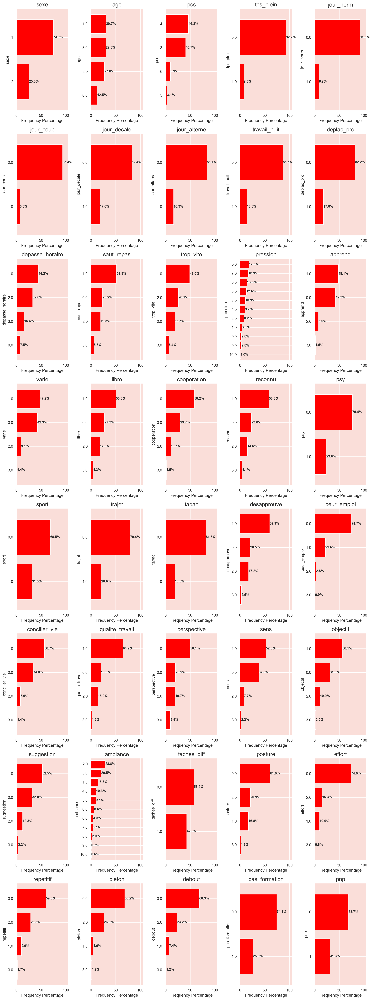

In [14]:
# Calcule le nombre de colonnes dans le DataFrame.
num_features = len(df.columns)
# Définit le nombre de colonnes pour les graphiques.
n_cols = 5
# Calcule le nombre de lignes nécessaire pour afficher toutes les colonnes.
n_rows = (num_features + n_cols - 1) // n_cols

# Crée la grille de sous-graphiques.
fig, ax = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 5 * n_rows))

# Boucle sur chaque colonne pour créer un graphique.
for i, col in enumerate(df.columns):
    # Détermine la position (ligne, colonne) du graphique.
    row = i // n_cols
    col_idx = i % n_cols

    # Calcule les pourcentages de chaque valeur et les trie.
    value_counts = df[col].value_counts(normalize=True).mul(100).sort_values()

    # Trace un graphique à barres horizontales.
    value_counts.plot(kind='barh', ax=ax[row, col_idx], width=0.8, color='red')

    # Ajoute les pourcentages sur les barres.
    for index, value in enumerate(value_counts):
        ax[row, col_idx].text(value, index, str(round(value, 1)) + '%', fontsize=10, weight='bold', va='center')

    # Ajuste les limites de l'axe X pour le texte.
    ax[row, col_idx].set_xlim([0, 105])
    # Définit les étiquettes et les titres.
    ax[row, col_idx].set_xlabel('Frequency Percentage', fontsize=12)
    ax[row, col_idx].set_title(f'{col}', fontsize=16)

# Ajuste la mise en page pour éviter les chevauchements.
plt.tight_layout()
# Sauvegarde le graphique dans un fichier.
plt.savefig('Images/ml/frequency_stat.png')
# Affiche le graphique.
plt.show()

# Analyse bivariée

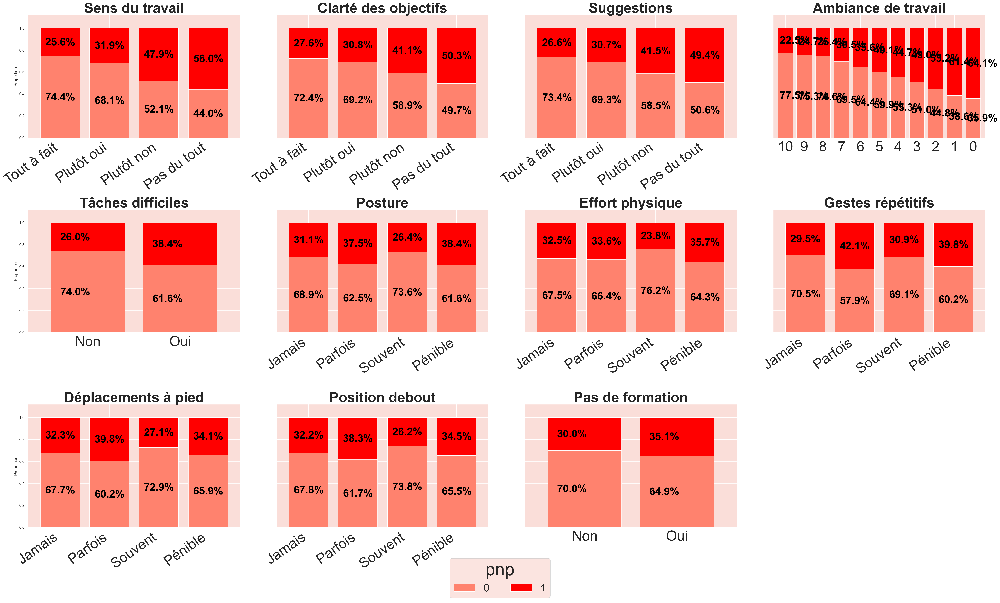

In [15]:
# Définit les mappings pour chaque variable : pour traduire les valeurs numériques en étiquettes lisibles (par ex. 0 en 'Non', 1 en 'Oui')
# Dictionnaire pour les variables binaires Oui/Non et son inverse
binary_map = {0: 'Non', 1: 'Oui'}
binary_map_reverse = {0: 'Oui', 1: 'Non'}

# Dictionnaires pour l'échelle d'accord de 0 à 3 et son inverse
scale_0_3_map = {0: 'Pas du tout', 1: 'Plutôt non', 2: 'Plutôt oui', 3: 'Tout à fait'}
scale_0_3_map_reverse = {0: 'Tout à fait', 1: 'Plutôt oui', 2: 'Plutôt non', 3: 'Pas du tout'}

# Dictionnaires pour l'échelle de 0 à 10 et son inverse
scale_0_10_map = {0: '0', 1: '1', 2: '2', 3: '3', 4: '4', 5: '5', 6: '6', 7: '7', 8: '8', 9: '9', 10: '10'}
scale_0_10_map_reverse = {0: '10', 1: '9', 2: '8', 3: '7', 4: '6', 5: '5', 6: '4', 7: '3', 8: '2', 9: '1', 10: '0'}

# Dictionnaires pour les fréquences
frequency_0_3_map = {0: 'Jamais', 1: 'Rarement', 2: 'Souvent', 3: 'Très souvent'}
frequency_0_3_map_penible = {0: 'Jamais', 1: 'Parfois', 2: 'Souvent', 3: 'Pénible'}

# Dictionnaires spécifiques pour le sexe, l'âge et la PCS
sexe_map = {1: 'Homme', 2: 'Femme'}
age_map = {0: '<30', 1: '30–40', 2: '40–50', 3: '>50'}
pcs_map = {3: 'Cadres', 4: 'Interm.', 5: 'Employés', 6: 'Ouvriers'}

# Dictionnaire regroupant tous les mappings pour les variables
all_variable_mappings = {
    'sexe': sexe_map, 'age': age_map, 'pcs': pcs_map, 'pression': scale_0_10_map, 'ambiance': scale_0_10_map_reverse,
    'tps_plein': binary_map_reverse, 'jour_norm': binary_map_reverse, 'jour_coup': binary_map,
    'jour_decale': binary_map, 'jour_alterne': binary_map, 'travail_nuit': binary_map,
    'deplac_pro': binary_map, 'depasse_horaire': frequency_0_3_map, 'saut_repas': frequency_0_3_map,
    'trop_vite': frequency_0_3_map, 'apprend': scale_0_3_map_reverse, 'varie': scale_0_3_map_reverse,
    'libre': scale_0_3_map_reverse, 'cooperation': scale_0_3_map_reverse, 'reconnu': scale_0_3_map_reverse,
    'psy': binary_map, 'desapprouve': scale_0_3_map, 'peur_emploi': scale_0_3_map,
    'concilier_vie': scale_0_3_map_reverse, 'qualite_travail': scale_0_3_map_reverse, 'perspective': scale_0_3_map_reverse,
    'sens': scale_0_3_map_reverse, 'objectif': scale_0_3_map_reverse, 'suggestion': scale_0_3_map_reverse,
    'taches_diff': binary_map, 'posture': frequency_0_3_map_penible, 'effort': frequency_0_3_map_penible,
    'repetitif': frequency_0_3_map_penible, 'pieton': frequency_0_3_map_penible, 'debout': frequency_0_3_map_penible,
    'pas_formation': binary_map, 'sport': binary_map_reverse, 'trajet': binary_map, 'tabac': binary_map
}

# Dictionnaire pour les noms de variables (plus lisibles)
pretty_names = {
    'sexe': 'Sexe', 'age': 'Tranche d’âge', 'pcs': 'Profession', 'pression': 'Pression perçue',
    'ambiance': 'Ambiance de travail', 'tps_plein': 'Temps plein', 'jour_norm': 'Horaire normal',
    'jour_coup': 'Journée coupée', 'jour_decale': 'Travail décalé', 'jour_alterne': 'Horaires alternants',
    'travail_nuit': 'Travail de nuit', 'deplac_pro': 'Déplacements pro.', 'depasse_horaire': 'Dépassements horaires',
    'saut_repas': 'Saut de repas', 'trop_vite': 'Travail trop rapide', 'apprend': 'Apprend au travail',
    'varie': 'Variété des tâches', 'libre': 'Autonomie', 'cooperation': 'Coopération', 'reconnu': 'Reconnaissance',
    'psy': 'Souffrance psy.', 'desapprouve': 'Désapprobation', 'peur_emploi': 'Peur pour l’emploi',
    'concilier_vie': 'Conciliation vie perso', 'qualite_travail': 'Qualité du travail',
    'perspective': 'Perspectives', 'sens': 'Sens du travail', 'objectif': 'Clarté des objectifs',
    'suggestion': 'Suggestions', 'taches_diff': 'Tâches difficiles', 'posture': 'Posture',
    'effort': 'Effort physique', 'repetitif': 'Gestes répétitifs', 'pieton': 'Déplacements à pied',
    'debout': 'Position debout', 'pas_formation': 'Pas de formation', 'sport': 'Pratique du sport',
    'trajet': 'Long trajet', 'tabac': 'Tabac'
}

# Crée une liste de toutes les colonnes à analyser, en excluant 'pnp'
all_columns = [col for col in df.columns if col != 'pnp']

# Divise les colonnes en deux groupes pour créer deux fichiers PDF et mieux intégrer dans le rapport
split_index = 28
part1_features = all_columns[:split_index]
part2_features = all_columns[split_index:]

# Définit la fonction pour créer et sauvegarder les graphiques dans un fichier PDF
def plot_features_to_pdf(features, filename, mappings):
    # Calcule les dimensions de la grille de graphiques
    n_cols = 4
    n_rows = (len(features) + n_cols - 1) // n_cols

    # Crée la figure et la grille de sous-graphiques
    fig, ax = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(40, 8 * n_rows))
    ax = ax.flatten()

    # Boucle sur chaque variable pour générer un graphique
    for i, col in enumerate(features):

        # Crée une table de contingence pour le graphique
        cross_tab = pd.crosstab(index=df[col], columns=df['pnp'])
        # Calcule les proportions pour les barres empilées
        cross_tab_prop = pd.crosstab(index=df[col], columns=df['pnp'], normalize='index')
        # Définit une palette de couleurs pour le graphique.
        cmp = ListedColormap(['#ff826e', 'red'])

        # Trace un graphique à barres empilées
        cross_tab_prop.plot(kind='bar', ax=ax[i], stacked=True, width=0.8, colormap=cmp,
                             legend=False, ylabel='Proportion', sharey=True)

        # Ajoute le pourcentage sur chaque segment des barres
        for idx, val in enumerate(cross_tab.index.values):
            for (proportion, y_location) in zip(
                cross_tab_prop.loc[val],
                cross_tab_prop.loc[val].cumsum()
            ):
                ax[i].text(x=idx - 0.3,
                           y=(y_location - proportion) + (proportion / 2) - 0.03,
                           s=f'{np.round(proportion * 100, 1)}%',
                           color="black", fontsize=30, fontweight="bold")

        # Ajuste les paramètres du graphique : limites, étiquettes, titres
        ax[i].set_ylim([0, 1.12])
        ax[i].set_xlabel('')
        ax[i].set_title(pretty_names.get(col, col), fontsize=40, fontweight='bold')

        # Applique les étiquettes lisibles si un mapping existe
        if col in mappings:
            unique_values_in_col = sorted(df[col].dropna().unique())
            current_labels = [mappings[col].get(val, str(val)) for val in unique_values_in_col]
            ax[i].set_xticks(range(len(unique_values_in_col)))
            
            # Fait pivoter les étiquettes si elles sont trop longues.
            needs_rotation = any(len(label) > 5 for label in current_labels)
            rotation_angle = 35 if needs_rotation else 0
            ha_align = 'right' if needs_rotation else 'center'
            ax[i].set_xticklabels(current_labels, rotation=rotation_angle, ha=ha_align, fontsize=40)
        else:
            ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=0)

    # Supprime les sous-graphiques vides
    for j in range(len(features), len(ax)):
        fig.delaxes(ax[j])

    # Ajoute une légende unique en bas de la figure
    handles, labels = ax[0].get_legend_handles_labels()
    if handles:
        fig.legend(handles, labels, title='pnp', loc='lower center', ncol=2, fontsize=30, title_fontsize=50)

    # Ajuste la mise en page et sauvegarde le graphique
    plt.tight_layout(rect=[0, 0.05, 1, 1])
    plt.savefig(filename)

# Appelle la fonction pour créer et sauvegarder les deux fichiers PDF
plot_features_to_pdf(part1_features, 'Images/ml/pnp_stat_part1.pdf', all_variable_mappings)
plot_features_to_pdf(part2_features, 'Images/ml/pnp_stat_part2.pdf', all_variable_mappings)

L'analyse des données met en évidence une augmentation des PNP dans les situations et chez les groupes suivants :

- Sexe : Les femmes présentent des PNP plus élevé.

- Âge : Les individus âgés de 40 ans sont davantage concernés.

- PCS : Les employés sont davantage concernés.

- Statut d'emploi : Ceux qui ne travaillent pas à temps plein.

- Heures de travail : Les personnes dépassant fréquemment leurs horaires normaux.

- Habitudes de travail : Celles et ceux qui sautent souvent un repas et ne prennent pas de pause.

- Charge et rapidité : Les situations où l'on traite trop vite une opération.

- Pression : Une augmentation des PNP est observée avec une pression temporelle grandissante.

- Qualité du travail : Le manque de moyens pour réaliser un travail de qualité.

- Développement professionnel : Ceux qui n'apprennent rien dans leur travail.

- Le manque de travail varié.

- Un déficit de liberté dans la façon de procéder.

- Un manque de coopération et de reconnaissance.

- Une mauvaise ambiance de travail.

- Perspectives et objectifs : L'absence de perspectives claires, d'objectifs et de prise en compte des suggestions.

- Pression psychologique : La présence de pression psychologique.

- Conflit de valeurs : Faire des choses que l'on désapprouve.

- Sécurité de l'emploi : La peur de perdre son emploi.

- Équilibre vie pro/perso : Un manque de conciliation entre vie professionnelle et personnelle.

- Stratégies d'évitement : L'abandon de tâches perçues comme perturbantes.

# Prétraitement des données

In [16]:
# Convertir les données en entier
for feature in df.columns:
    df[feature] = df[feature].astype('int')

In [17]:
df.dtypes

sexe               int64
age                int64
pcs                int64
tps_plein          int64
jour_norm          int64
jour_coup          int64
jour_decale        int64
jour_alterne       int64
travail_nuit       int64
deplac_pro         int64
depasse_horaire    int64
saut_repas         int64
trop_vite          int64
pression           int64
apprend            int64
varie              int64
libre              int64
cooperation        int64
reconnu            int64
psy                int64
sport              int64
trajet             int64
tabac              int64
desapprouve        int64
peur_emploi        int64
concilier_vie      int64
qualite_travail    int64
perspective        int64
sens               int64
objectif           int64
suggestion         int64
ambiance           int64
taches_diff        int64
posture            int64
effort             int64
repetitif          int64
pieton             int64
debout             int64
pas_formation      int64
pnp                int64


In [18]:
# Définir les caractéristiques (X) et les étiquettes de sortie (y)
X = df.drop('pnp', axis=1)
y = df['pnp'] 

In [19]:
# Découper les données en ensembles d'entraînement et de test (80/20 %)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

In [20]:
print(y_train.shape)
print(y_test.shape)

(38153,)
(9539,)


# t-SNE

In [21]:
print("Début de l'ajustement et de la transformation t-SNE...")

# Réduction de dimension avec t-SNE
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_train)
print("t-SNE terminé.")

Début de l'ajustement et de la transformation t-SNE...
t-SNE terminé.


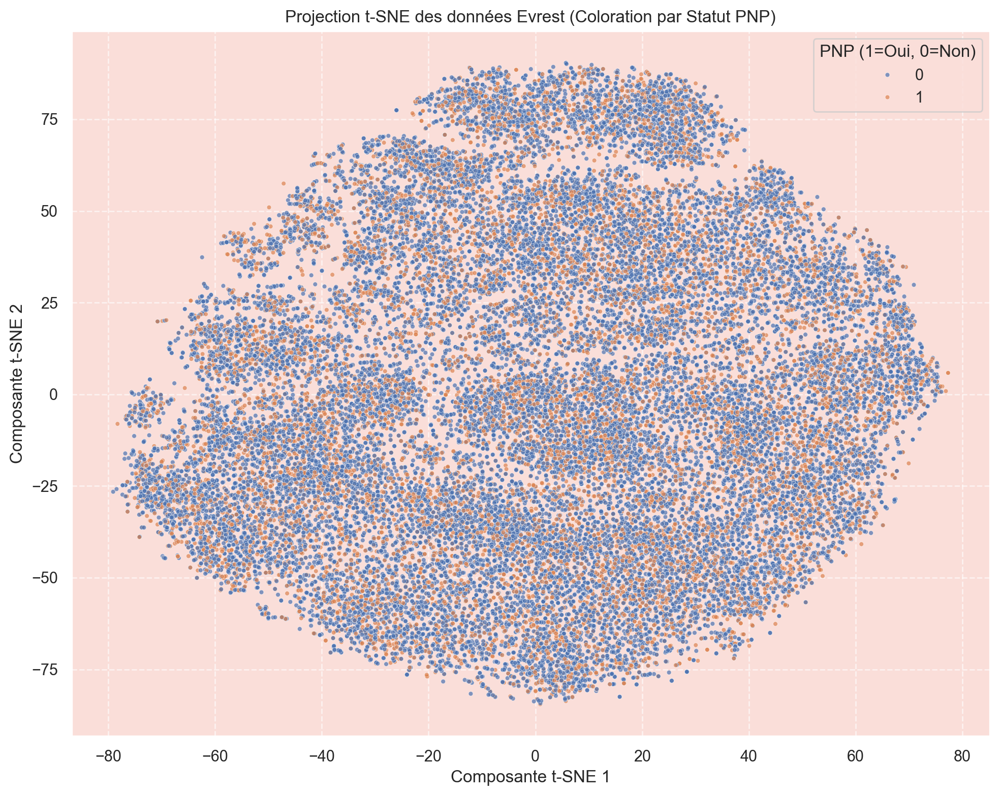

Forme de l'intégration t-SNE : (38153, 3)


In [22]:
embedding_tsne_df = pd.DataFrame(X_tsne, columns=['tSNE1', 'tSNE2'])

embedding_tsne_df['pnp'] = y.reset_index(drop=True)

plt.figure(figsize=(10, 8))
sns.scatterplot(
    x='tSNE1',
    y='tSNE2',
    hue='pnp',
    data=embedding_tsne_df,
    s=10,
    alpha=0.7
)
plt.title('Projection t-SNE des données Evrest (Coloration par Statut PNP)')
plt.xlabel('Composante t-SNE 1')
plt.ylabel('Composante t-SNE 2')
plt.legend(title='PNP (1=Oui, 0=Non)')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig('Images/ml/tsne.png')
plt.show()

print(f"Forme de l'intégration t-SNE : {embedding_tsne_df.shape}")

# Construction du modèle d'arbre de décision

In [23]:
# Crée une instance du classifieur d'arbre de décision (DecisionTreeClassifier)
dt_base = DecisionTreeClassifier(random_state=42)

## Optimisation des hyperparamètres de l'arbre de décision

In [24]:
# Définit une fonction pour optimiser les hyperparamètres d'un classifieur
def tune_clf_hyperparameters(clf, param_distributions, X_train, y_train, scoring='recall', n_splits=3, n_iter=100):
    cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    clf_rand = RandomizedSearchCV(clf, param_distributions, n_iter=n_iter, cv=cv, scoring=scoring, n_jobs=-1, random_state=0)
    clf_rand.fit(X_train, y_train)
    # Retourne le meilleur modèle trouvé et ses paramètres optimaux
    return clf_rand.best_estimator_, clf_rand.best_params_

In [25]:
# Grille d'hyperparamètres pour l'optimisation d'un arbre de décision
param_grid_dt = {
    'criterion': ['entropy'],
    'max_depth': [3, 5, 8, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [2, 4,6],
    'class_weight': [None, 'balanced']
}

In [26]:
best_dt, best_dt_hyperparams = tune_clf_hyperparameters(dt_base, param_grid_dt, X_train, y_train)

In [27]:
print('Hyperparamètres Optimaux pour DT : \n', best_dt_hyperparams)

Hyperparamètres Optimaux pour DT : 
 {'min_samples_split': 2, 'min_samples_leaf': 2, 'max_depth': 3, 'criterion': 'entropy', 'class_weight': 'balanced'}


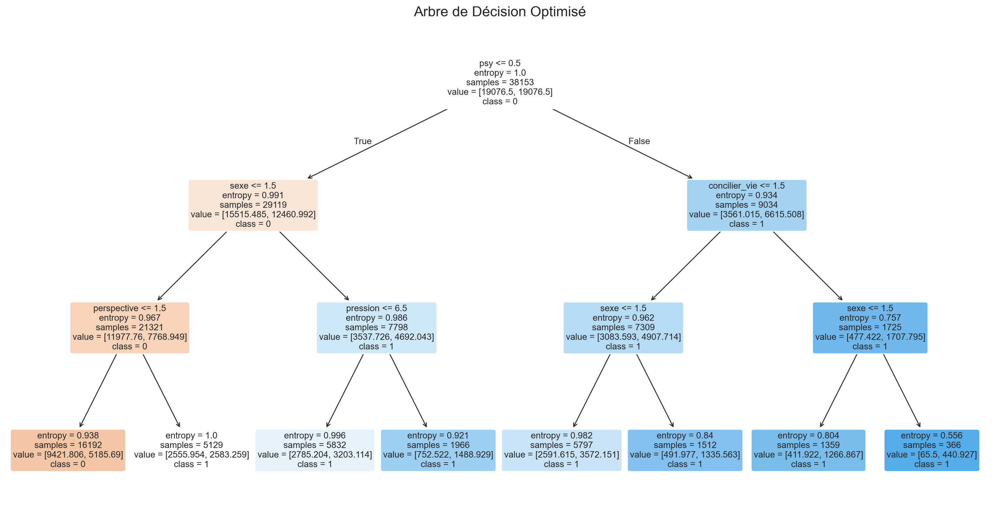

In [73]:
labels = X_train.columns
class_names = [str(c) for c in best_dt.classes_]

plt.figure(figsize=(20, 10))
plot_tree(best_dt,
          feature_names=labels,
          class_names=class_names,
          max_depth=3,
          filled=True,
          rounded=True,
          fontsize=10
         )
plt.title("Arbre de Décision Optimisé", fontsize=16)
plt.savefig('Images/ml/decision_tree.png')
plt.show()

## Évaluation du modèle d'arbre de décision

In [29]:
# Affiche le rapport de classification du modèle sur les données d'entraînement
print(classification_report(y_train, best_dt.predict(X_train)))

              precision    recall  f1-score   support

           0       0.80      0.49      0.61     26212
           1       0.40      0.73      0.51     11941

    accuracy                           0.57     38153
   macro avg       0.60      0.61      0.56     38153
weighted avg       0.67      0.57      0.58     38153



In [30]:
# Affiche le rapport de classification du modèle sur les données test
print(classification_report(y_test, best_dt.predict(X_test)))

              precision    recall  f1-score   support

           0       0.80      0.49      0.61      6554
           1       0.39      0.72      0.51      2985

    accuracy                           0.56      9539
   macro avg       0.59      0.61      0.56      9539
weighted avg       0.67      0.56      0.58      9539



In [31]:
# Définit une fonction pour évaluer un modèle sur des données de test

def evaluate_model(model, X_test, y_test, model_name):
    # Fait des prédictions sur les données de test
    y_pred = model.predict(X_test)
    
    report = classification_report(y_test, y_pred, output_dict=True)
    
    # Extrait les métriques clés du rapport dans un dictionnaire
    metrics = {
        "precision_0": report["0"]["precision"],
        "precision_1": report["1"]["precision"],
        "recall_0": report["0"]["recall"],
        "recall_1": report["1"]["recall"],
        "accuracy": accuracy_score(y_test, y_pred)
    }
    
    df = pd.DataFrame(metrics, index=[model_name]).round(2)
    
    # Retourne le DataFrame de métriques et les prédictions
    return df, y_pred

In [32]:
dt_evaluation, y_pred_dt = evaluate_model(best_dt, X_test, y_test, 'DT')
dt_evaluation

,precision_0,precision_1,recall_0,recall_1,accuracy
DT,0.8,0.39,0.49,0.72,0.56


# Construction du modèle de forêt aléatoire

In [34]:
rf_base = RandomForestClassifier(random_state=42)

## Optimisation des hyperparamètres de la forêt aléatoire

In [35]:
param_grid_rf = {
    'n_estimators': [50, 100, 200, 400],
    'criterion': ['entropy'],
    'max_depth': [3, 5, 10, None],
    'min_samples_split': [2, 4, 6],
    'min_samples_leaf': [3, 5, 10, 20],
    'class_weight': [None, 'balanced']
}

In [36]:
best_rf, best_rf_hyperparams = tune_clf_hyperparameters(rf_base, param_grid_rf, X_train, y_train)
print('Hyperparamètres Optimaux pour RF: \n', best_rf_hyperparams)

Hyperparamètres Optimaux pour RF: 
 {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 20, 'max_depth': 10, 'criterion': 'entropy', 'class_weight': 'balanced'}


## Évaluation du modèle de forêt aléatoire

In [37]:
print(classification_report(y_train, best_rf.predict(X_train)))

              precision    recall  f1-score   support

           0       0.81      0.71      0.76     26212
           1       0.50      0.64      0.56     11941

    accuracy                           0.69     38153
   macro avg       0.66      0.68      0.66     38153
weighted avg       0.72      0.69      0.70     38153



In [38]:
print(classification_report(y_test, best_rf.predict(X_test)))

              precision    recall  f1-score   support

           0       0.79      0.70      0.74      6554
           1       0.47      0.59      0.52      2985

    accuracy                           0.66      9539
   macro avg       0.63      0.64      0.63      9539
weighted avg       0.69      0.66      0.67      9539



In [39]:
rf_evaluation,y_pred_rf = evaluate_model(best_rf, X_test, y_test, 'RF')
rf_evaluation

,precision_0,precision_1,recall_0,recall_1,accuracy
RF,0.79,0.47,0.7,0.59,0.66


# Construction du modèle de Gradient Boosting

In [41]:
lgbm_base = LGBMClassifier(random_state=42)

## Optimisation des hyperparamètres de LightLGBM

In [42]:
param_grid_lgbm = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [15, 30, 60],
    'max_depth': [5, 10, 20, None],
    'class_weight': [None, 'balanced']
}

In [43]:
best_lgbm, best_lgbm_hyperparams = tune_clf_hyperparameters(lgbm_base, param_grid_lgbm, X_train, y_train)
print('LightGBM Optimal Hyperparameters: \n', best_lgbm_hyperparams)

[LightGBM] [Info] Number of positive: 11941, number of negative: 26212
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005011 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 144
[LightGBM] [Info] Number of data points in the train set: 38153, number of used features: 39
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
LightGBM Optimal Hyperparameters: 
 {'num_leaves': 15, 'n_estimators': 100, 'max_depth': None, 'learning_rate': 0.01, 'class_weight': 'balanced'}


## Évaluation du modèle LightLGBM

In [44]:
print(classification_report(y_train, best_lgbm.predict(X_train)))

              precision    recall  f1-score   support

           0       0.80      0.65      0.71     26212
           1       0.45      0.64      0.53     11941

    accuracy                           0.64     38153
   macro avg       0.62      0.64      0.62     38153
weighted avg       0.69      0.64      0.66     38153



In [45]:
print(classification_report(y_test, best_lgbm.predict(X_test)))

              precision    recall  f1-score   support

           0       0.79      0.64      0.71      6554
           1       0.45      0.63      0.52      2985

    accuracy                           0.64      9539
   macro avg       0.62      0.64      0.62      9539
weighted avg       0.68      0.64      0.65      9539



In [46]:
lgbm_evaluation,y_pred_lgbm  = evaluate_model(best_lgbm, X_test, y_test, 'LightGBM')
lgbm_evaluation

,precision_0,precision_1,recall_0,recall_1,accuracy
LightGBM,0.79,0.45,0.64,0.63,0.64


# Construction du modèle de Régression Logistique

In [48]:
lr_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('lr', LogisticRegression(random_state=42))
])

## Optimisation des hyperparamètres de la Régression Logistique

In [49]:
param_grid_lr = {
    'lr__penalty': ['l1', 'l2', 'None'],
    'lr__class_weight': [None, 'balanced'],
    'lr__solver': ['lbfgs','newton-cg','liblinear','sag','saga'],
    'lr__C': [0.01, 0.1, 1, 10, 100]
}

In [50]:
best_lr, best_lr_hyperparams = tune_clf_hyperparameters(lr_pipeline, param_grid_lr, X_train, y_train)
print('LR Optimal Hyperparameters: \n', best_lr_hyperparams)

LR Optimal Hyperparameters: 
 {'lr__solver': 'liblinear', 'lr__penalty': 'l1', 'lr__class_weight': 'balanced', 'lr__C': 0.01}


## Évaluation du modèle Régression Logistique

In [51]:
print(classification_report(y_train, best_lr.predict(X_train)))

              precision    recall  f1-score   support

           0       0.79      0.66      0.72     26212
           1       0.45      0.63      0.53     11941

    accuracy                           0.65     38153
   macro avg       0.62      0.64      0.62     38153
weighted avg       0.69      0.65      0.66     38153



In [52]:
print(classification_report(y_test, best_lr.predict(X_test)))

              precision    recall  f1-score   support

           0       0.79      0.67      0.72      6554
           1       0.46      0.62      0.53      2985

    accuracy                           0.65      9539
   macro avg       0.63      0.64      0.63      9539
weighted avg       0.69      0.65      0.66      9539



In [53]:
lr_evaluation, y_pred_lr = evaluate_model(best_lr, X_test, y_test, 'LR')
lr_evaluation

,precision_0,precision_1,recall_0,recall_1,accuracy
LR,0.79,0.46,0.67,0.62,0.65


# ROC

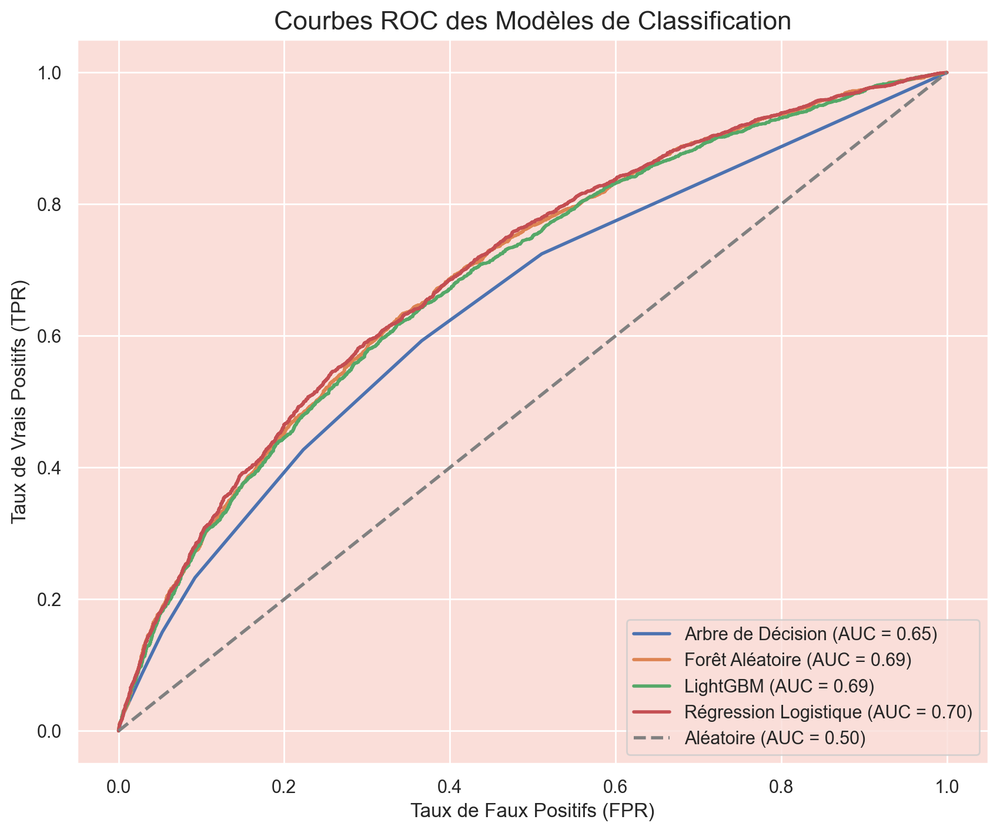

In [72]:
# Définit une fonction pour tracer les courbes ROC
def plot_roc_curves(models, X_test, y_test, model_names):
    plt.figure(figsize=(10, 8))
    
    # Boucle sur chaque modèle et son nom
    for model, name in zip(models, model_names):
        # Calcule les probabilités de la classe positive
        y_probs = model.predict_proba(X_test)[:, 1]
        
        # Calcule le taux de faux positifs (FPR) et de vrais positifs (TPR)
        fpr, tpr, _ = roc_curve(y_test, y_probs)
        
        # Calcule l'aire sous la courbe (AUC)
        auc = roc_auc_score(y_test, y_probs)
        
        # Trace la courbe ROC pour le modèle actuel
        plt.plot(fpr, tpr, lw=2, label=f'{name} (AUC = {auc:.2f})')
        
    # Trace la ligne de base d'un classifieur aléatoire
    plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--', label='Aléatoire (AUC = 0.50)')    
    plt.xlabel('Taux de Faux Positifs (FPR)')
    plt.ylabel('Taux de Vrais Positifs (TPR)')
    plt.title('Courbes ROC des Modèles de Classification', fontsize=16)
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.savefig('Images/ml/roc.png')
    plt.show()

# Définit la liste des modèles entraînés à comparer
models = [best_dt, best_rf, best_lgbm, best_lr]

# Définit la liste des noms des modèles correspondants
model_names = ['Arbre de Décision', 'Forêt Aléatoire','LightGBM', 'Régression Logistique']

# Appelle la fonction pour tracer les courbes ROC.
plot_roc_curves(models, X_test, y_test, model_names)

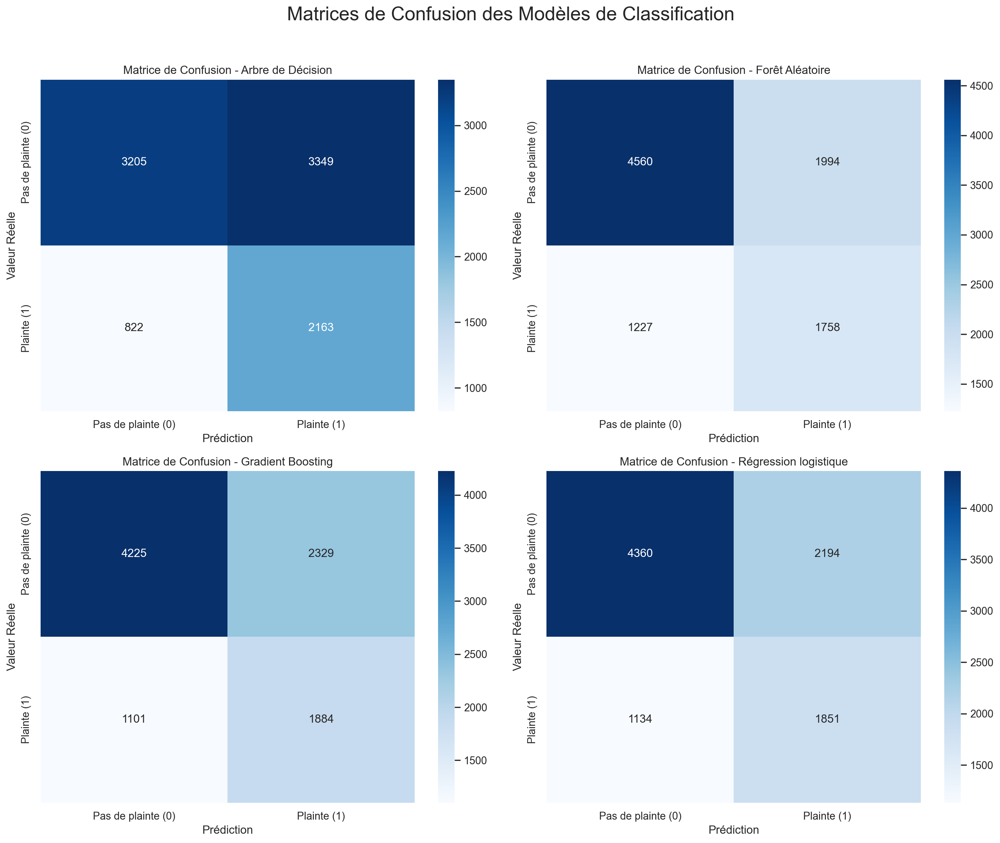

In [84]:
def plot_confusion_matrix(y_true, y_pred, ax, title):
    
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=['Pas de plainte (0)', 'Plainte (1)'],
        yticklabels=['Pas de plainte (0)', 'Plainte (1)'],
        ax=ax
    )
    ax.set_title(title)
    ax.set_xlabel('Prédiction')
    ax.set_ylabel('Valeur Réelle')

fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Matrices de Confusion des Modèles de Classification', fontsize=20, y=1.02)

# Tracer chaque matrice de confusion sur son propre sous-graphique
plot_confusion_matrix(y_test, y_pred_dt, ax=axes[0, 0], title="Matrice de Confusion - Arbre de Décision")
plot_confusion_matrix(y_test, y_pred_rf, ax=axes[0, 1], title="Matrice de Confusion - Forêt Aléatoire")
plot_confusion_matrix(y_test, y_pred_lgbm, ax=axes[1, 0], title="Matrice de Confusion - Gradient Boosting")
plot_confusion_matrix(y_test, y_pred_lr, ax=axes[1, 1], title="Matrice de Confusion - Régression logistique")

plt.tight_layout()
plt.savefig('Images/ml/confusion_matrix_transversal.png')
plt.show()

# Conclusion

In [56]:
# Concatène les DataFrames d'évaluation en un seul DataFrame
all_evaluations = [dt_evaluation, rf_evaluation, lr_evaluation,lgbm_evaluation]
results = pd.concat(all_evaluations)

# Trie les résultats en fonction de la colonne 'recall_1' par ordre décroissant
results = results.sort_values(by='recall_1', ascending=False).round(2)
results

,precision_0,precision_1,recall_0,recall_1,accuracy
DT,0.80,0.39,0.49,0.72,0.56
LightGBM,0.79,0.45,0.64,0.63,0.64
LR,0.79,0.46,0.67,0.62,0.65
RF,0.79,0.47,0.70,0.59,0.66


- La précision répond à la question : "Parmi toutes les fois où mon modèle a dit 'oui, c'est positif' (donc avec plainte), combien de fois avait-il raison ?"
- Le rappel répond à la question : "Parmi tous les cas qui sont réellement positifs (donc réellement avec plainte), combien mon modèle en a-t-il correctement détectés ?"

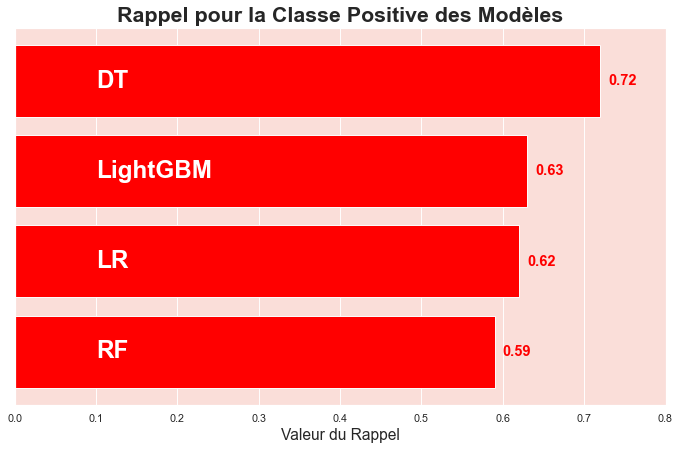

In [57]:
# Trie le DataFrame 'results' par la colonne 'recall_1' par ordre croissant
results.sort_values(by='recall_1', ascending=True, inplace=True)
# Stocke les valeurs de 'recall_1' dans une variable.
recall_1_scores = results['recall_1']

# Crée une figure et des axes pour le graphique à barres
fig, ax = plt.subplots(figsize=(12, 7), dpi=70)

# Trace un graphique à barres horizontales avec les scores de rappel
ax.barh(results.index, recall_1_scores, color='red')

# Boucle pour ajouter des annotations (valeurs et noms de modèles) sur chaque barre.
for i, (value, name) in enumerate(zip(recall_1_scores, results.index)):
    # Ajoute la valeur numérique du score à la fin de la barre
    ax.text(value + 0.01, i, f"{value:.2f}", ha='left', va='center', fontweight='bold', color='red', fontsize=15)
    # Ajoute le nom du modèle à l'intérieur de la barre
    ax.text(0.1, i, name, ha='left', va='center', fontweight='bold', color='white', fontsize=25)

ax.set_yticks([])
ax.set_xlim([0, 0.8])

# Ajoute le titre et l'étiquette de l'axe x.
plt.title("Rappel pour la Classe Positive des Modèles", fontweight='bold', fontsize=22)
plt.xlabel('Valeur du Rappel', fontsize=16)
# Affiche le graphique.
plt.show()